### community clustering
This notebook performs community clustering using the Louvain method from the Brain Connectivity Toolbox

In [1]:
import bct
import numpy as np
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv('../data/average_connectome_data.csv', header=0, index_col=0)
W = df.to_numpy()

In [3]:
# run Louvain algorithm for community detection
gamma=1.0
Ci, Q = bct.modularity_louvain_dir(W, gamma=gamma)

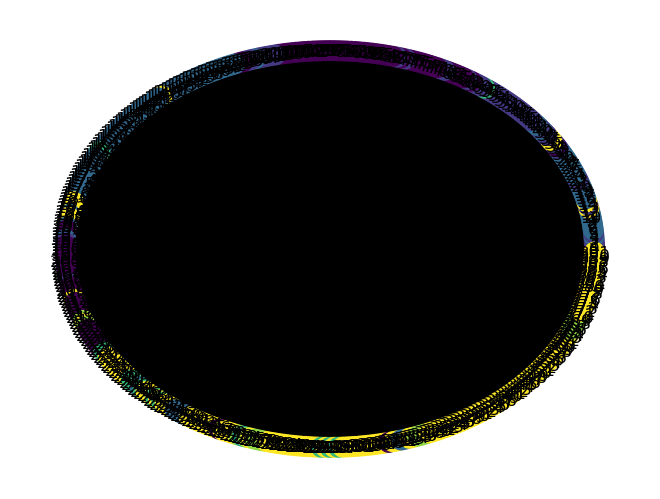

In [4]:
# Build graph
G = nx.from_numpy_array(W)  # undirected weighted graph
colors = [Ci[i] for i in range(len(Ci))]

# Circular layout
pos = nx.circular_layout(G)

# Draw nodes colored by community
nx.draw(G, pos, node_color=colors, with_labels=True, node_size=200)
plt.show()


In [10]:
import numpy as np

def circle_layout(n, radius=1.0, start_angle=90):
    theta = np.deg2rad(start_angle) + 2*np.pi*np.arange(n)/n
    x = radius*np.cos(theta)
    y = radius*np.sin(theta)
    return np.c_[x,y]

def select_edges(W, edge_frac=None, per_node_topk=None, min_weight=None):
    """Return list of (i,j,weight) with i<j after thresholding."""
    n = W.shape[0]
    edges = []
    if per_node_topk is not None:
        for i in range(n):
            row = W[i].copy()
            row[i] = 0
            idx = np.argsort(row)[::-1]  # descending
            k = min(per_node_topk, n-1)
            count = 0
            for j in idx:
                if j == i or row[j] <= 0: 
                    continue
                a, b = (i, j) if i < j else (j, i)
                # avoid duplicates
                if all(not (e[0]==a and e[1]==b) for e in edges):
                    edges.append((a,b,row[j]))
                    count += 1
                    if count >= k:
                        break
    else:
        iu = np.triu_indices(n, 1)
        vals = W[iu]
        mask = vals > 0
        idx = np.flatnonzero(mask)
        weights = vals[mask]
        order = idx[np.argsort(weights)[::-1]]
        if edge_frac is not None:
            keep = max(1, int(edge_frac * len(order)))
            order = order[:keep]
        for flat in order:
            i = iu[0][flat]; j = iu[1][flat]
            edges.append((i, j, W[i, j]))
    if min_weight is not None:
        edges = [(i,j,w) for (i,j,w) in edges if w >= min_weight]
    return edges

def community_colors(Ci, cmap_name="tab20"):
    import matplotlib.cm as cm
    import matplotlib.colors as mcolors
    labs = np.unique(Ci)
    cmap = cm.get_cmap(cmap_name, len(labs))
    mapping = {lab: mcolors.to_hex(cmap(k)) for k, lab in enumerate(labs)}
    colors = [mapping[c] for c in Ci]
    return colors, mapping


In [11]:
import numpy as np
import plotly.graph_objects as go

def _quadratic_bezier(p0, p1, p2, t):
    return (1-t)**2 * p0 + 2*(1-t)*t * p1 + t**2 * p2

def plot_connectogram_plotly(W, Ci, edge_frac=0.03, node_size=12):
    n = W.shape[0]
    pos = circle_layout(n, radius=1.0, start_angle=90)
    node_colors, cmap_dict = community_colors(Ci)  # hex colors

    edges = select_edges(W, edge_frac=edge_frac)

    edge_traces = []
    for i, j, w in edges:
        p0 = pos[i]; p2 = pos[j]; p1 = np.array([0.0, 0.0])  # control point at center
        t = np.linspace(0, 1, 30)
        curve = _quadratic_bezier(p0, p1, p2, t[:, None])
        edge_traces.append(
            go.Scatter(
                x=curve[:,0], y=curve[:,1],
                mode='lines',
                line=dict(width=max(0.5, 4.0*w), shape='spline'),
                opacity=0.35,
                hoverinfo='text',
                text=f"{i+1} \u2192 {j+1}<br>weight={w:.3f}",
                showlegend=False
            )
        )

    node_trace = go.Scatter(
        x=pos[:,0], y=pos[:,1],
        mode='markers+text',
        text=[str(i+1) for i in range(n)],
        textposition='middle center',
        marker=dict(size=node_size, color=node_colors, line=dict(width=1, color='white')),
        hoverinfo='text',
        hovertext=[f"Node {i+1}<br>Comm {Ci[i]}" for i in range(n)],
        showlegend=False
    )

    fig = go.Figure(data=edge_traces + [node_trace])
    fig.update_xaxes(visible=False); fig.update_yaxes(visible=False, scaleanchor='x', scaleratio=1)
    fig.update_layout(
        width=800, height=800, plot_bgcolor='white', paper_bgcolor='white',
        margin=dict(l=10, r=10, t=10, b=10)
    )

    # Add a community legend
    fig.update_layout(
        legend=dict(x=1.02, y=1.0),
        annotations=[
            dict(x=1.15, y=1.0 - 0.05*k, xref='paper', yref='paper',
                 text=f"<b>Comm {lab}</b>",
                 showarrow=False, font=dict(color=c))
            for k, (lab, c) in enumerate(cmap_dict.items())
        ]
    )
    return fig

# Example:



In [12]:
fig = plot_connectogram_plotly(W, Ci, edge_frac=0.03)
fig.show()

/var/folders/4k/31jdbs595pn4tslnsm4nxmzm0000gq/T/ipykernel_52168/1133968924.py:51: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap_name, len(labs))


In [15]:
import matplotlib.pyplot as plt
from matplotlib.path import Path
from matplotlib.patches import PathPatch

def plot_connectogram_matplotlib(W, Ci, edge_frac=0.03, node_size=120, lw_scale=5.0):
    n = W.shape[0]
    pos = circle_layout(n, radius=1.0, start_angle=90)
    node_colors, cmap_dict = community_colors(Ci)

    edges = select_edges(W, edge_frac=edge_frac)

    fig, ax = plt.subplots(figsize=(8,8))
    ax.set_aspect('equal'); ax.axis('off')

    # draw edges as quadratic bezier curves via center (0,0)
    for i, j, w in edges:
        x0, y0 = pos[i]; x1, y1 = pos[j]
        verts = [(x0, y0), (0.0, 0.0), (x1, y1)]
        codes = [Path.MOVETO, Path.CURVE3, Path.CURVE3]
        patch = PathPatch(Path(verts, codes),
                          lw=max(0.2, w * lw_scale),
                          alpha=0.35,
                          edgecolor='k')  # color edges neutral; avoids color clutter
        ax.add_patch(patch)

    # draw nodes
    ax.scatter(pos[:,0], pos[:,1], s=node_size, c=node_colors, zorder=3, edgecolors='white', linewidths=1.2)

    # labels around circle
    for i, (x, y) in enumerate(pos):
        ax.text(1.12*x, 1.12*y, str(i+1), ha='center', va='center', fontsize=9)

    # simple legend mapping communities
    handles = [plt.Line2D([0],[0], marker='o', linestyle='', color=c, label=f'Comm {lab}')
               for lab, c in cmap_dict.items()]
    leg = ax.legend(handles=handles, bbox_to_anchor=(1.04, 1), loc='upper left', borderaxespad=0.)
    plt.tight_layout()
    return fig, ax

/var/folders/4k/31jdbs595pn4tslnsm4nxmzm0000gq/T/ipykernel_52168/1133968924.py:51: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



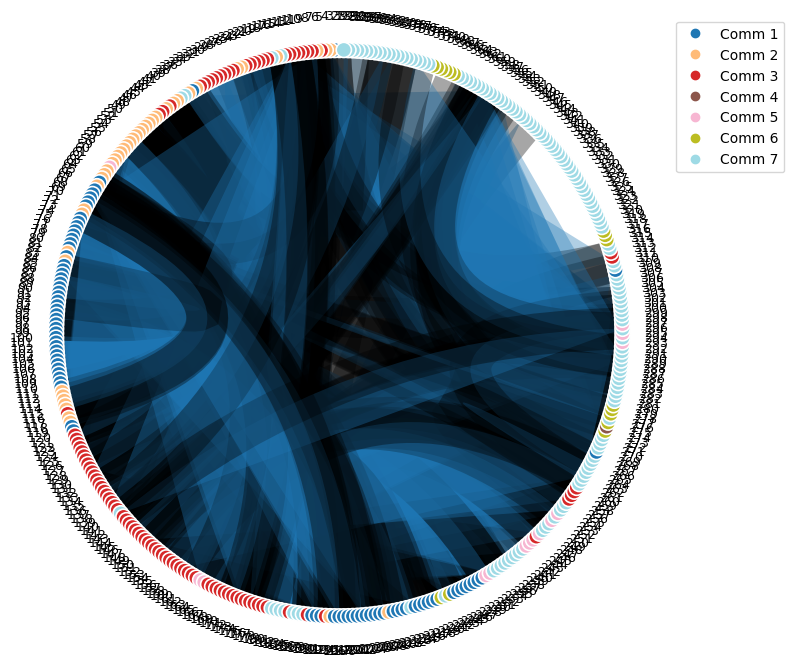

In [16]:
# Example:
fig, ax = plot_connectogram_matplotlib(W, Ci, edge_frac=0.03)
plt.show()

# The above are hard to read...

In [17]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.sparse.csgraph import minimum_spanning_tree

def circle_layout(n, radius=1.0, start_angle=90):
    theta = np.deg2rad(start_angle) + 2*np.pi*np.arange(n)/n
    return np.c_[radius*np.cos(theta), radius*np.sin(theta)]

def community_order(Ci, W, within_sort='degree'):
    # order nodes by (community, within-community score)
    Ci = np.asarray(Ci); labs = np.unique(Ci)
    order = []
    for lab in labs:
        idx = np.where(Ci == lab)[0]
        if within_sort == 'degree':
            score = W[idx][:, idx].sum(1) + W[idx].sum(1)  # weighted degree bias
            sub = idx[np.argsort(-score)]
        else:
            sub = idx
        order.extend(sub.tolist())
    return np.array(order), labs

def graph_backbone(W, keep_frac=0.01, add_mst=True):
    """Return boolean mask E_ij of kept undirected edges (i<j)."""
    n = W.shape[0]
    A = W.copy(); np.fill_diagonal(A, 0)
    A = np.maximum(A, A.T)  # sym
    iu = np.triu_indices(n, 1)
    vals = A[iu]
    # strongest edges
    pos = vals > 0
    strong_idx = np.flatnonzero(pos)[np.argsort(vals[pos])[::-1]]
    keep = max(1, int(keep_frac * strong_idx.size)) if keep_frac is not None else strong_idx.size
    keep_set = set(strong_idx[:keep].tolist())

    # optional MST to guarantee connectivity (on distance = max(A)-A)
    if add_mst:
        if A.max() > 0:
            D = A.max() - A
        else:
            D = 1 - A  # fallback
        mst = minimum_spanning_tree(D)  # returns sparse csr of directed form
        mst = mst + mst.T
        mi, mj = mst.nonzero()
        mst_flats = set(np.ravel_multi_index(
            (np.minimum(mi, mj), np.maximum(mi, mj)), dims=(n, n)))
        # convert to upper-tri indices space
        mst_keep = set()
        for i, j in zip(mi, mj):
            if i < j:
                flat = (iu[0] == i) & (iu[1] == j)
            else:
                flat = (iu[0] == j) & (iu[1] == i)
            idx = np.flatnonzero(flat)[0]
            mst_keep.add(idx)
        keep_set |= mst_keep

    keep_mask = np.zeros_like(vals, dtype=bool)
    keep_mask[list(keep_set)] = True
    E = np.zeros_like(A, dtype=bool)
    E[iu] = keep_mask
    E = E | E.T
    return E

def plot_connectogram_tidy(W, Ci, keep_frac=0.01, add_mst=True, node_size=18):
    # prep
    W = np.array(W, float); W = np.maximum(W, W.T); np.fill_diagonal(W, 0)
    order, labs = community_order(Ci, W, within_sort='degree')
    Wp = W[order][:, order]; Cip = np.asarray(Ci)[order]

    n = Wp.shape[0]
    pos = circle_layout(n, radius=1.0, start_angle=90)
    # colors per community
    import matplotlib.cm as cm; import matplotlib.colors as mcolors
    cmap = cm.get_cmap('tab20', len(np.unique(Cip)))
    color_map = {lab: mcolors.to_hex(cmap(k)) for k, lab in enumerate(np.unique(Cip))}
    node_colors = [color_map[c] for c in Cip]

    # backbone
    E = graph_backbone(Wp, keep_frac=keep_frac, add_mst=add_mst)

    # plot
    fig, ax = plt.subplots(figsize=(9,9))
    ax.set_aspect('equal'); ax.axis('off')

    # module wedges (subtle separators)
    tick = 1.08
    last = 0
    for lab in labs:
        idx = np.where(Cip == lab)[0]
        if idx.size == 0: continue
        start, end = idx.min(), idx.max()
        ax.plot([pos[start,0]*tick, pos[start,0]*tick],
                [pos[start,1]*tick, pos[start,1]*tick],
                alpha=0)  # noop, keeps legend spacing
        # ring arc label at module midpoint
        mid = idx[len(idx)//2]
        ax.text(1.18*pos[mid,0], 1.18*pos[mid,1], f"C{lab}", ha='center', va='center',
                fontsize=9, color=color_map[lab], fontweight='bold')

    # edges (thin, translucent)
    ii, jj = np.where(np.triu(E, 1))
    weights = Wp[ii, jj]
    wmin, wmax = weights.min(), weights.max()
    for i, j, w in zip(ii, jj, weights):
        # width scaled 0.5–3.5
        lw = 0.5 + 3.0 * ((w - wmin) / (wmax - wmin + 1e-9))
        ax.plot([pos[i,0], pos[j,0]], [pos[i,1], pos[j,1]],
                lw=lw, alpha=0.25, color='k', zorder=1)

    # nodes
    ax.scatter(pos[:,0], pos[:,1], s=node_size**2, c=node_colors,
               edgecolors='white', linewidths=0.8, zorder=3)
    # thin outer circle
    theta = np.linspace(0, 2*np.pi, 400)
    ax.plot(np.cos(theta), np.sin(theta), color='#999999', lw=0.6, alpha=0.6)
    plt.tight_layout()
    return fig, ax

# Usage:



/var/folders/4k/31jdbs595pn4tslnsm4nxmzm0000gq/T/ipykernel_52168/2320985265.py:75: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



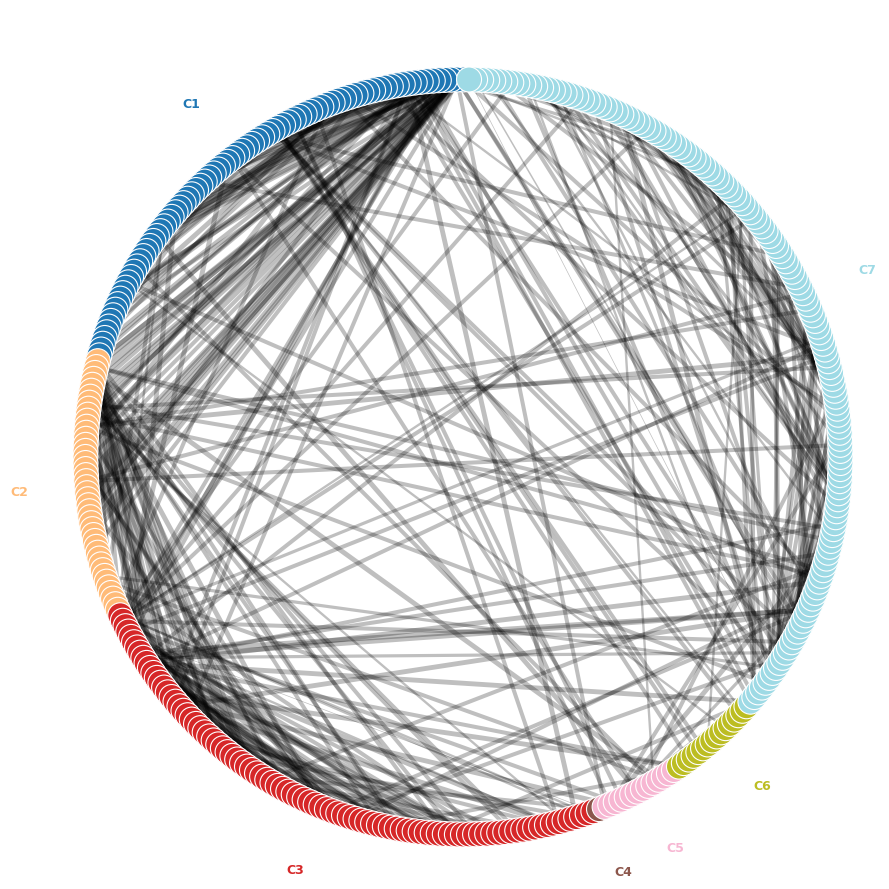

In [18]:
fig, ax = plot_connectogram_tidy(W, Ci, keep_frac=0.005, add_mst=True)
plt.show()